In [97]:
import librosa
import numpy as np
import os

# set parameters for MFCC feature extraction
n_mfcc = 15
hop_length = 512
n_fft = 2048

# set parameters for voice activity detection
frame_length = int(hop_length*2) # 1.024s
threshold_ratio = 1.5

# define a function to extract MFCC features and VAD labels for a single audio file
def extract_mfcc_vad_segments(audio_file_path):
    # load audio file
    audio_file, sr = librosa.load(audio_file_path, sr=16000)

    # calculate energy of each frame
    energy = librosa.feature.rms(y = audio_file, frame_length=frame_length, hop_length=hop_length)[0]

    # calculate a threshold for voice activity detection
    threshold = np.mean(energy) * threshold_ratio

    # create an array to store the voice activity labels
    vad_labels = np.zeros_like(energy)

    # set frames with energy above the threshold as active
    vad_labels[energy > threshold] = 1

    # get start and end indices of segments where power is above threshold
    vad_segments = librosa.core.frames_to_samples(np.where(np.diff(np.concatenate(([0], vad_labels, [0]))) != 0)[0])
    vad_segments = vad_segments.reshape((-1, 2))

    # extract MFCC features on each segment
    mfcc_features = []
    for start, end in vad_segments:
        mfcc = librosa.feature.mfcc(y = audio_file[start:end], sr=sr, n_mfcc=n_mfcc, hop_length=hop_length, n_fft=n_fft).T
        #print(mfcc.shape[0])
        for i in range(mfcc.shape[0]):
            mfcc_features.append(mfcc[i])

    # stack the MFCC features into a 3D array
    #mfcc_features = np.stack(mfcc_features)
    mfcc_features = np.array(mfcc_features)
    return mfcc_features

# define a function to extract MFCC features for a list of audio files
def extract_dataset_mfcc_vad_segments(dataset_path):
    # create empty array to store MFCC features

    # iterate through audio files in the dataset
    #for audio_file_name in os.listdir(dataset_path):
    #    if audio_file_name.endswith('.wav'):
    #        audio_file_path = os.path.join(dataset_path, audio_file_name)

            # extract MFCC features on segments where power is above threshold
    mfcc = extract_mfcc_vad_segments(dataset_path)

            # append the MFCC features to the array
    mfcc_features = np.array(mfcc)
    # stack the MFCC features into a 4D array
    #mfcc_features = np.stack(mfcc_features)

    return mfcc_features

In [98]:
# example usage
dataset_path = "./amicorpus/IB4010/audio/IB4010.Mix-Headset.wav"
mfcc_features = extract_dataset_mfcc_vad_segments(dataset_path)
mfcc_features = np.array(mfcc_features)
mfcc_features = mfcc_features.flatten()
print("MFCC features shape:", mfcc_features.shape[0])

C:\Users\91860\AppData\Local\Programs\Python\Python310\lib\site-packages\librosa\core\spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=1024
  warnings.warn(
C:\Users\91860\AppData\Local\Programs\Python\Python310\lib\site-packages\librosa\core\spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=1536
  warnings.warn(
C:\Users\91860\AppData\Local\Programs\Python\Python310\lib\site-packages\librosa\core\spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=512
  warnings.warn(


MFCC features shape: 382095


In [99]:
mfcc_features = np.array(mfcc_features)
print(mfcc_features.shape[0])
print(mfcc_features)

382095
[-1.91188431e+02  1.14908188e+02  3.33354263e+01  3.20853081e+01
  2.37144127e+01  1.95490742e+01  1.49306116e+01  1.34298286e+01
  9.76234818e+00  8.64542961e+00  5.85106659e+00  4.85556889e+00
  4.40967083e+00  2.81921196e+00  2.55116129e+00 -2.34292542e+02
  1.19434731e+02  3.43508186e+01  4.44593048e+01  2.95988579e+01
  2.26247387e+01  1.83001766e+01  1.50811024e+01  1.12472191e+01
  1.22145643e+01  4.43048477e+00  3.77753687e+00  6.47163391e+00
  1.39662504e+00  1.49968565e+00 -2.87496307e+02  1.20276932e+02
  2.62622643e+01  4.95057602e+01  2.94703197e+01  2.80988445e+01
  2.34328480e+01  1.19372377e+01  9.05604172e+00  1.97867928e+01
  6.15141678e+00  1.70767212e+00  4.76325703e+00  8.56988072e-01
  2.61529350e+00 -2.29974472e+02  7.89308167e+01  5.06460991e+01
  4.37240906e+01  3.51106567e+01  3.37583542e+01  1.78713531e+01
  9.54522705e+00  1.96799812e+01  1.07837620e+01  1.42703066e+01
 -1.21966515e+01  7.38692999e+00  3.81279230e-01 -8.61713171e-01
 -2.04179016e+02  

In [100]:
n_mfcc = 15
mfcc = np.zeros((mfcc_features.shape[0],n_mfcc))
mfcc = np.reshape(mfcc_features,(-1,15))    
#print(mfcc)
print(mfcc)

[[-1.91188431e+02  1.14908188e+02  3.33354263e+01  3.20853081e+01
   2.37144127e+01  1.95490742e+01  1.49306116e+01  1.34298286e+01
   9.76234818e+00  8.64542961e+00  5.85106659e+00  4.85556889e+00
   4.40967083e+00  2.81921196e+00  2.55116129e+00]
 [-2.34292542e+02  1.19434731e+02  3.43508186e+01  4.44593048e+01
   2.95988579e+01  2.26247387e+01  1.83001766e+01  1.50811024e+01
   1.12472191e+01  1.22145643e+01  4.43048477e+00  3.77753687e+00
   6.47163391e+00  1.39662504e+00  1.49968565e+00]
 [-2.87496307e+02  1.20276932e+02  2.62622643e+01  4.95057602e+01
   2.94703197e+01  2.80988445e+01  2.34328480e+01  1.19372377e+01
   9.05604172e+00  1.97867928e+01  6.15141678e+00  1.70767212e+00
   4.76325703e+00  8.56988072e-01  2.61529350e+00]
 [-2.29974472e+02  7.89308167e+01  5.06460991e+01  4.37240906e+01
   3.51106567e+01  3.37583542e+01  1.78713531e+01  9.54522705e+00
   1.96799812e+01  1.07837620e+01  1.42703066e+01 -1.21966515e+01
   7.38692999e+00  3.81279230e-01 -8.61713171e-01]
 [-2

In [101]:
from sklearn.mixture import *
import matplotlib.pyplot as plt

n_components = np.arange(1, 21)
models = [GaussianMixture(n, covariance_type='full', random_state=0, max_iter = 1000).fit(mfcc)
          for n in n_components]

In [102]:
def avg(x,y):
    return (x+y)/2.0

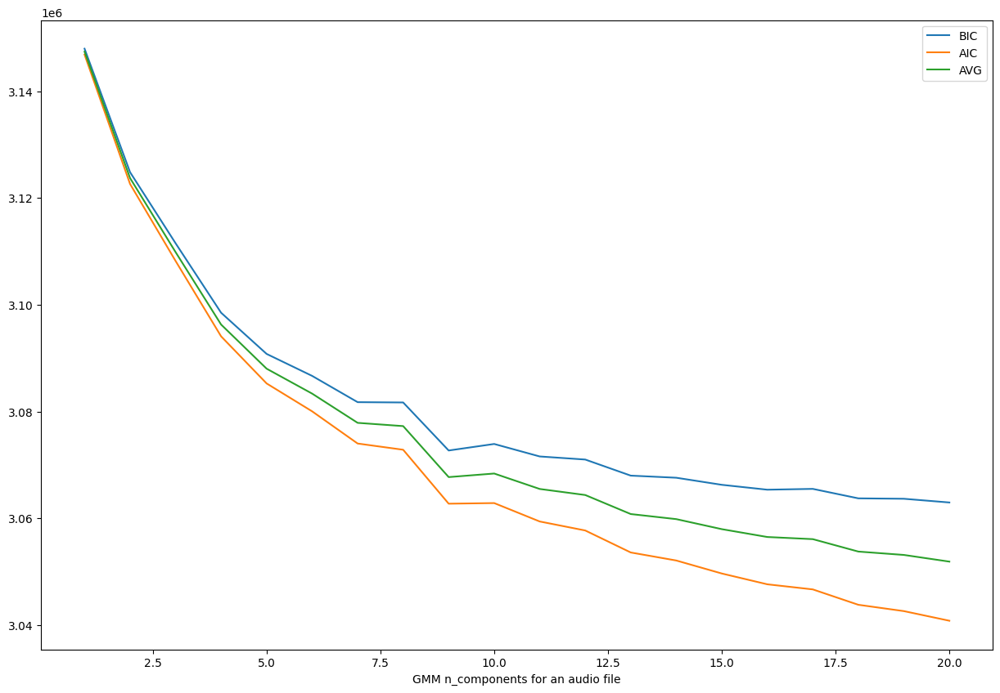

In [103]:
plt.figure(figsize=(15, 10))
plt.plot(n_components, [m.bic(mfcc) for m in models], label='BIC')
plt.plot(n_components, [m.aic(mfcc) for m in models], label='AIC')
plt.plot(n_components, [avg(m.bic(mfcc),m.aic(mfcc)) for m in models], label='AVG')
plt.legend(loc='best')
plt.xlabel('GMM n_components for an audio file');

In [104]:
#clustering mfccs into speech patterns
n_speakers = 3
print(mfcc.shape[0])
model = GaussianMixture(n_speakers, covariance_type='full', random_state=0, max_iter = 1000).fit(mfcc)

25473


In [105]:
#define emission parameters
emission_mean = model.means_
emission_covariance = model.covariances_
emission_weight = model.weights_

In [115]:
#split the dataset into 70:30
train = mfcc[:int(0.7*mfcc.shape[0])]
test = mfcc[int(0.7*mfcc.shape[0]+1):]
print(test.shape[0])

7641


In [116]:
def result(output):
    start_time = 0
    end_time = 0.39
    x = 1
    while(x<output.shape[0]):
        while(x<output.shape[0] and output[x]==output[x-1]):
            end_time += 0.39
            x += 1
            if(x==output.shape[0]):
                break
        x += (x!=output.shape[0])
        print("Time: ",round(start_time,3)," to ",round(end_time,3)," : Speaker ",output[x-1]+1)
        start_time = end_time
        end_time += 0.39

In [108]:
#standard HMM
import numpy as np
from scipy.stats import multivariate_normal
from hmmlearn import hmm

class MultivariateGaussianHMM:
    def __init__(self, n_components):
        self.n_components = n_components
        self.transmat = None
        self.means = None
        self.covars = None
        self.dists = None
        self.model = None
    
    def fit(self, obs):
        # Initialize the transition probability matrix
        self.transmat = np.ones((self.n_components, self.n_components)) / self.n_components

        # Initialize the mean vectors and covariance matrices for each hidden state
        self.means = np.random.randn(self.n_components, obs.shape[1])
        self.covars = np.tile(np.eye(obs.shape[1]), (self.n_components, 1, 1))

        # Create the multivariate normal distributions for each hidden state
        self.dists = [multivariate_normal(mean=self.means[i], cov=self.covars[i]) for i in range(self.n_components)]

        # Initialize the HMM object
        self.model = hmm.GaussianHMM(n_components=self.n_components, covariance_type="full")

        # Fit the model to the data
        self.model.fit(obs)

    def predict(self, obs):
        # Predict the hidden states for a new sequence of observations
        return self.model.predict(obs)


In [109]:
Hmm = MultivariateGaussianHMM(n_components = 3)
Hmm.fit(train)

C:\Users\91860\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [117]:
import numpy as np
np.set_printoptions(threshold=np.inf)

output = Hmm.predict(test)
print(result(output))

Time:  0  to  0.39  : Speaker  1
Time:  0.39  to  1.56  : Speaker  3
Time:  1.56  to  3.9  : Speaker  1
Time:  3.9  to  6.63  : Speaker  3
Time:  6.63  to  8.97  : Speaker  1
Time:  8.97  to  12.09  : Speaker  3
Time:  12.09  to  20.28  : Speaker  2
Time:  20.28  to  21.84  : Speaker  3
Time:  21.84  to  23.4  : Speaker  1
Time:  23.4  to  24.96  : Speaker  3
Time:  24.96  to  26.52  : Speaker  1
Time:  26.52  to  29.64  : Speaker  3
Time:  29.64  to  34.32  : Speaker  1
Time:  34.32  to  37.44  : Speaker  3
Time:  37.44  to  40.17  : Speaker  1
Time:  40.17  to  44.85  : Speaker  2
Time:  44.85  to  46.02  : Speaker  1
Time:  46.02  to  47.19  : Speaker  3
Time:  47.19  to  50.31  : Speaker  1
Time:  50.31  to  58.11  : Speaker  3
Time:  58.11  to  59.67  : Speaker  1
Time:  59.67  to  60.84  : Speaker  2
Time:  60.84  to  62.01  : Speaker  1
Time:  62.01  to  65.52  : Speaker  3
Time:  65.52  to  72.15  : Speaker  1
Time:  72.15  to  73.71  : Speaker  3
Time:  73.71  to  77.22  : Spe

In [111]:
#auto-regressive HMM
import numpy as np
from hmmlearn import hmm

class AR_GaussianHMM:
    def __init__(self, n_components, n_features, order, covariance_type='full'):
        self.n_components = n_components
        self.n_features = n_features
        self.order = order
        self.covariance_type = covariance_type

        self.hmm = hmm.GaussianHMM(n_components=self.n_components, covariance_type=self.covariance_type)

    def fit(self, X):
        """
        Fit the model to the data.
        X is an array of shape (n_samples, n_features).
        """
        n_samples, _ = X.shape
        X_lagged = self._create_lagged_X(X)

        self.hmm.startprob_ = np.ones(self.n_components) / self.n_components
        self.hmm.transmat_ = np.ones((self.n_components, self.n_components)) / self.n_components

        self.hmm.fit(X_lagged)

    def _create_lagged_X(self, X):
        """
        Create a lagged version of the data X for the given order.
        Returns an array of shape (n_samples, n_features * order).
        """
        n_samples, _ = X.shape
        X_lagged = np.zeros((n_samples - self.order, self.n_features * self.order))

        for i in range(self.order, n_samples):
            X_lagged[i - self.order] = X[i - self.order:i].flatten()

        return X_lagged

    def predict(self, X):
        """
        Predict the most likely sequence of hidden states for the given data.
        X is an array of shape (n_samples, n_features).
        Returns an array of shape (n_samples,) containing the predicted states.
        """
        n_samples, _ = X.shape
        X_lagged = self._create_lagged_X(X)

        _, state_sequence = self.hmm.decode(X_lagged)

        return state_sequence

    def sample(self, n_samples):
        """
        Generate a random sequence of observations and hidden states.
        n_samples is the length of the sequence to generate.
        Returns a tuple (X, Z) where X is an array of shape (n_samples, n_features)
        containing the generated observations, and Z is an array of shape (n_samples,)
        containing the corresponding hidden states.
        """
        _, state_sequence = self.hmm.sample(n_samples)

        X = np.zeros((n_samples, self.n_features))
        X[0:self.order] = np.random.randn(self.order, self.n_features)

        for i in range(self.order, n_samples):
            mu, Sigma = self._get_state_params(state_sequence[i-1])
            X[i] = np.random.multivariate_normal(mu, Sigma)

        return X, state_sequence

    def _get_state_params(self, state):
        """
        Get the mean and covariance matrix for the given state.
        """
        mu = self.hmm.means_[state]
        Sigma = self.hmm.covars_[state]

        return mu, Sigma

In [118]:
arhmm = AR_GaussianHMM(n_components = 3, n_features = 15, order = 2)
arhmm.fit(train)
output = arhmm.predict(test)
print(result(output))

Even though the 'startprob_' attribute is set, it will be overwritten during initialization because 'init_params' contains 's'
Even though the 'transmat_' attribute is set, it will be overwritten during initialization because 'init_params' contains 't'
C:\Users\91860\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Time:  0  to  0.78  : Speaker  3
Time:  0.78  to  1.95  : Speaker  1
Time:  1.95  to  3.51  : Speaker  2
Time:  3.51  to  3.9  : Speaker  1
Time:  3.9  to  4.68  : Speaker  2
Time:  4.68  to  5.07  : Speaker  3
Time:  5.07  to  6.63  : Speaker  1
Time:  6.63  to  7.41  : Speaker  2
Time:  7.41  to  7.8  : Speaker  1
Time:  7.8  to  8.58  : Speaker  2
Time:  8.58  to  8.97  : Speaker  1
Time:  8.97  to  11.7  : Speaker  2
Time:  11.7  to  12.09  : Speaker  3
Time:  12.09  to  13.26  : Speaker  2
Time:  13.26  to  13.65  : Speaker  1
Time:  13.65  to  14.43  : Speaker  2
Time:  14.43  to  14.82  : Speaker  1
Time:  14.82  to  15.6  : Speaker  2
Time:  15.6  to  15.99  : Speaker  3
Time:  15.99  to  17.16  : Speaker  2
Time:  17.16  to  17.55  : Speaker  3
Time:  17.55  to  18.72  : Speaker  2
Time:  18.72  to  19.11  : Speaker  1
Time:  19.11  to  19.89  : Speaker  2
Time:  19.89  to  20.28  : Speaker  1
Time:  20.28  to  21.45  : Speaker  2
Time:  21.45  to  21.84  : Speaker  1
Time:  2

In [113]:
#sticky HMM
from hmmlearn.hmm import GaussianHMM

class StickyGaussianHMM:
    def __init__(self, n_states, n_features, transmat_prior=1.0, means_prior=0, covars_prior=1.0, 
                 covars_weight=1, n_iter=100, tol=1e-2, init_params='mcs', random_state=None):
        self.n_states = n_states
        self.n_features = n_features
        self.transmat_prior = transmat_prior
        self.means_prior = means_prior
        self.covars_prior = covars_prior
        self.covars_weight = covars_weight
        self.n_iter = n_iter
        self.tol = tol
        self.init_params = init_params
        self.random_state = random_state
        
        self.model = None
    
    def fit(self, X, lengths=None):
        self.model = GaussianHMM(n_components=self.n_states, covariance_type='full', 
                                 transmat_prior=self.transmat_prior, means_prior=self.means_prior, 
                                 covars_prior=self.covars_prior, covars_weight=self.covars_weight, 
                                 n_iter=self.n_iter, tol=self.tol, init_params=self.init_params, 
                                 random_state=self.random_state)
        self.model.fit(X, lengths=lengths)
        
    def sample(self, n_samples):
        return self.model.sample(n_samples=n_samples)
    
    def predict(self, X):
        return self.model.predict(X)
    
    def predict_proba(self, X):
        return self.model.predict_proba(X)

In [119]:
sticky = StickyGaussianHMM(n_states = 3, n_features = 15)
sticky.fit(train)
output = sticky.predict(test)
print(result(output))

C:\Users\91860\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Time:  0  to  0.39  : Speaker  3
Time:  0.39  to  8.97  : Speaker  1
Time:  8.97  to  10.14  : Speaker  3
Time:  10.14  to  20.28  : Speaker  2
Time:  20.28  to  21.84  : Speaker  3
Time:  21.84  to  33.54  : Speaker  2
Time:  33.54  to  34.32  : Speaker  1
Time:  34.32  to  37.44  : Speaker  3
Time:  37.44  to  44.85  : Speaker  2
Time:  44.85  to  46.02  : Speaker  3
Time:  46.02  to  53.43  : Speaker  1
Time:  53.43  to  54.99  : Speaker  3
Time:  54.99  to  60.84  : Speaker  2
Time:  60.84  to  62.01  : Speaker  3
Time:  62.01  to  90.87  : Speaker  1
Time:  90.87  to  91.65  : Speaker  2
Time:  91.65  to  100.23  : Speaker  1
Time:  100.23  to  101.4  : Speaker  2
Time:  101.4  to  103.35  : Speaker  1
Time:  103.35  to  104.91  : Speaker  3
Time:  104.91  to  106.08  : Speaker  1
Time:  106.08  to  111.15  : Speaker  2
Time:  111.15  to  113.49  : Speaker  1
Time:  113.49  to  115.83  : Speaker  2
Time:  115.83  to  125.19  : Speaker  1
Time:  125.19  to  127.92  : Speaker  2
Tim